Class: DSC 680<br>
Student: Eros Perez<br>
Date: 5/2/25

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Show all columns
pd.set_option('display.max_columns', None)

# Show all rows (optional – careful with large datasets!)
pd.set_option('display.max_rows', None)

# Optional: prevent column width from truncating content
pd.set_option('display.max_colwidth', None)

In [41]:
df = pd.read_csv('Telco.csv')

### EDA

In [7]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [9]:
df.shape

(7043, 21)

In [11]:
# df.shape
df.info() #We have no missing values
# df.columns

# df.dtypes #Tells what type of values the column has


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


### Data Prep

In [43]:
#Let's drop cust ID, we don't need it
df = df.drop('customerID', axis=1)
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [15]:
df.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [17]:
df.dtypes

gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

#### Convert TotalCharges to Int from Object and then check nulls

In [45]:
#Safe way incase their are missing values
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df.isnull().sum()

#Drop Rows with missing data
df = df.dropna(subset=['TotalCharges'])

#Transform Senior Seitizen to Yes/No
df["SeniorCitizen"]= df["SeniorCitizen"].map({0: "No", 1: "Yes"})

df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [21]:
df.info()  ##We see we have no more nulls

<class 'pandas.core.frame.DataFrame'>
Index: 7032 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   gender            7032 non-null   object 
 1   SeniorCitizen     7032 non-null   object 
 2   Partner           7032 non-null   object 
 3   Dependents        7032 non-null   object 
 4   tenure            7032 non-null   int64  
 5   PhoneService      7032 non-null   object 
 6   MultipleLines     7032 non-null   object 
 7   InternetService   7032 non-null   object 
 8   OnlineSecurity    7032 non-null   object 
 9   OnlineBackup      7032 non-null   object 
 10  DeviceProtection  7032 non-null   object 
 11  TechSupport       7032 non-null   object 
 12  StreamingTV       7032 non-null   object 
 13  StreamingMovies   7032 non-null   object 
 14  Contract          7032 non-null   object 
 15  PaperlessBilling  7032 non-null   object 
 16  PaymentMethod     7032 non-null   object 
 17  

### Graphs

#### Plot Graphs against Churn to see which group curns the most

In [47]:
import plotly.express as px

def plot_churn_by_categorical_features(df, target_col='Churn'):
    # This excludes floats and ints
    categorical_cols = df.select_dtypes(exclude=['number']).columns
    categorical_cols = [col for col in categorical_cols if col != target_col]

    for col in categorical_cols:
        fig = px.histogram(
            df,
            x=target_col,
            color=col,
            barmode="group",
            title=f"<b>Churn by {col}</b>"
        )
        fig.update_layout(width=700, height=500, bargap=0.1)
        fig.show()
        
def plot_categorical_distributions(df):
    # Select all non-numeric columns
    categorical_cols = df.select_dtypes(exclude=['number']).columns

    for col in categorical_cols:
        fig = px.histogram(
            df,
            x=col,
            color=col,
            title=f"<b>Distribution of {col}</b>",
            barmode="group"
        )
        fig.update_layout(width=700, height=500, bargap=0.1)
        fig.show()

/var/folders/wq/ww_bmr8n49ldrd0lbgs116sh0000gn/T/ipykernel_1618/444666171.py:17: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



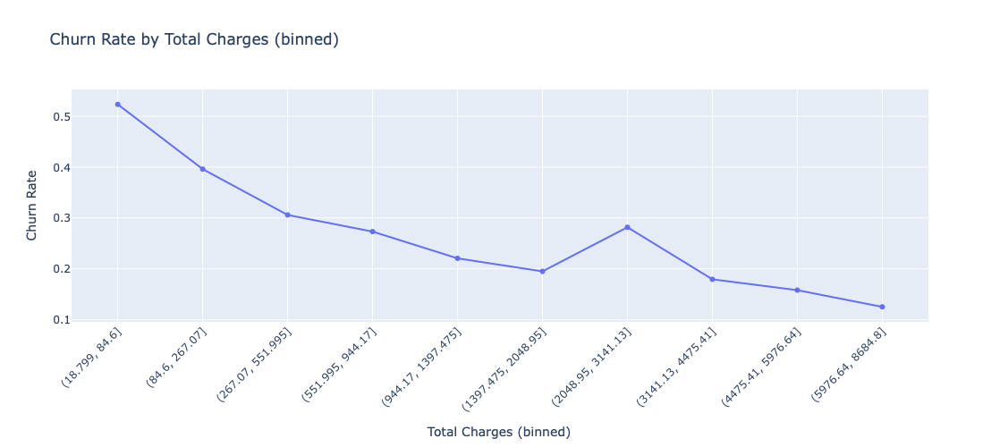

In [35]:
import pandas as pd
import plotly.express as px

df = pd.read_csv('Telco.csv')

# Step 1: Ensure TotalCharges is numeric
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
df = df.dropna(subset=['TotalCharges'])

# Step 2: Ensure Churn is binary
df['Churn'] = df['Churn'].map({'No': 0, 'Yes': 1})

# Step 3: Create bins for TotalCharges
df['TotalCharges_bin'] = pd.qcut(df['TotalCharges'], q=10)

# Step 4: Group and compute churn rate
churn_by_charge = df.groupby('TotalCharges_bin')['Churn'].mean().reset_index()
churn_by_charge['TotalCharges_bin'] = churn_by_charge['TotalCharges_bin'].astype(str)

# Step 5: Plot with Plotly
fig = px.line(
    churn_by_charge,
    x='TotalCharges_bin',
    y='Churn',
    markers=True,
    title='Churn Rate by Total Charges (binned)',
    labels={'TotalCharges_bin': 'Total Charges (binned)', 'Churn': 'Churn Rate'}
)
fig.update_layout(xaxis_tickangle=-45, height=500, width=900)
fig.show()
# churn_by_charge

#### Checks features against Churn

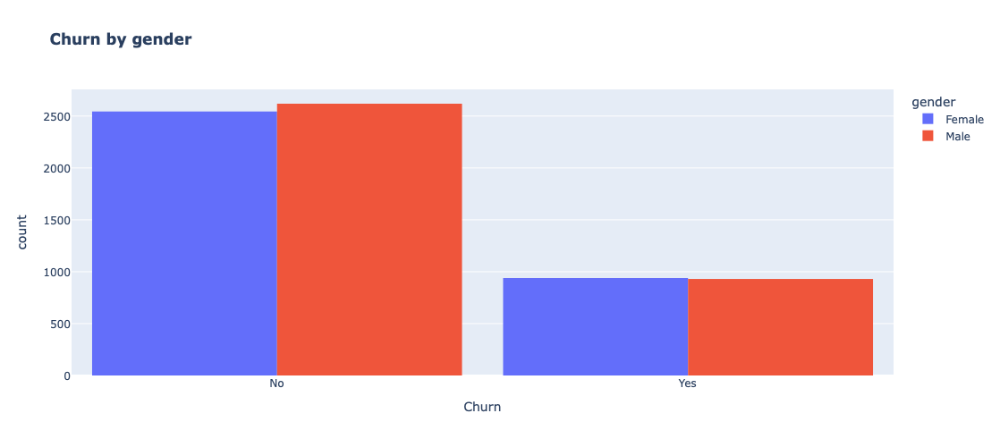

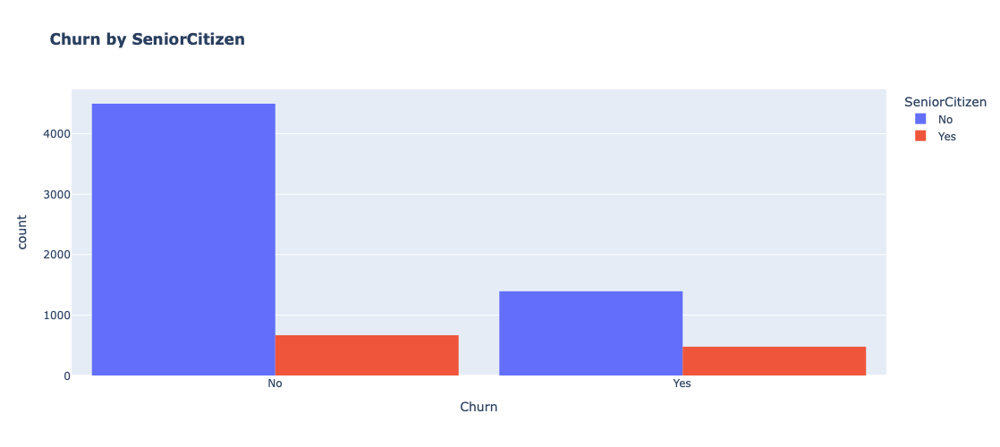

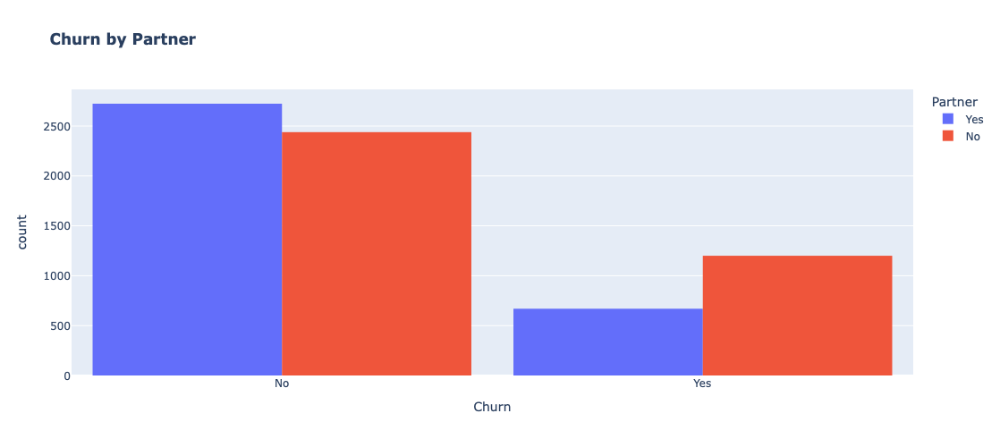

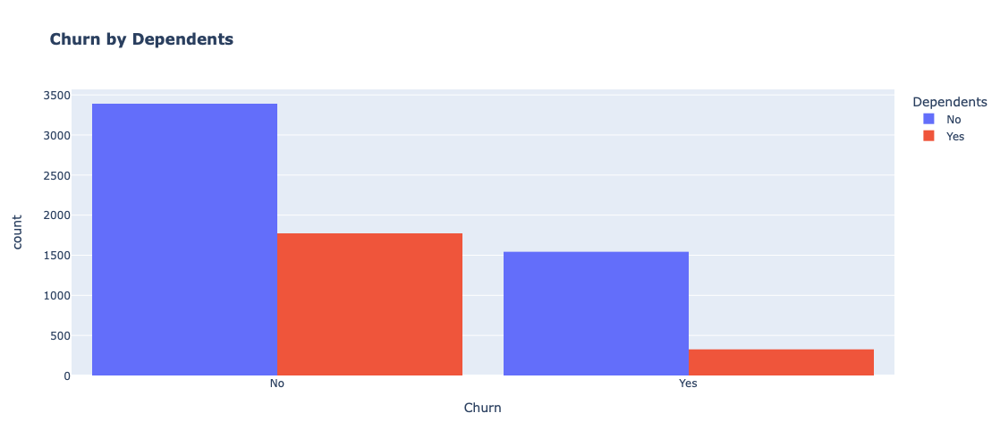

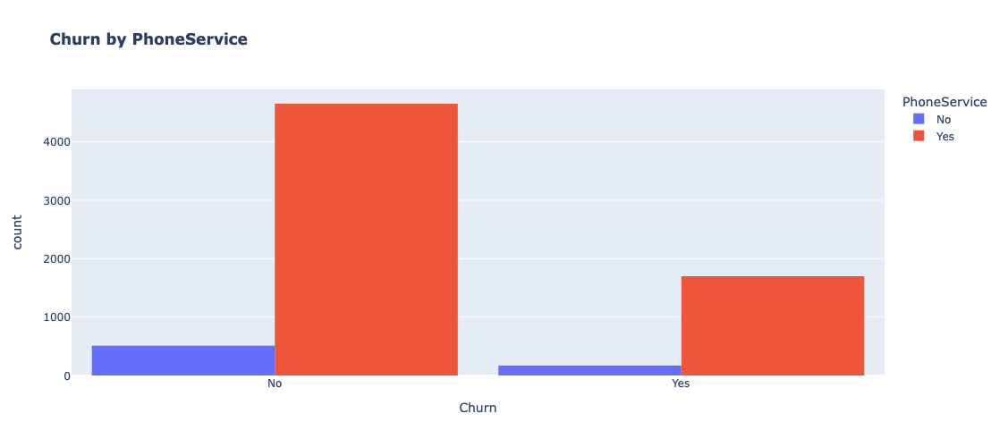

...

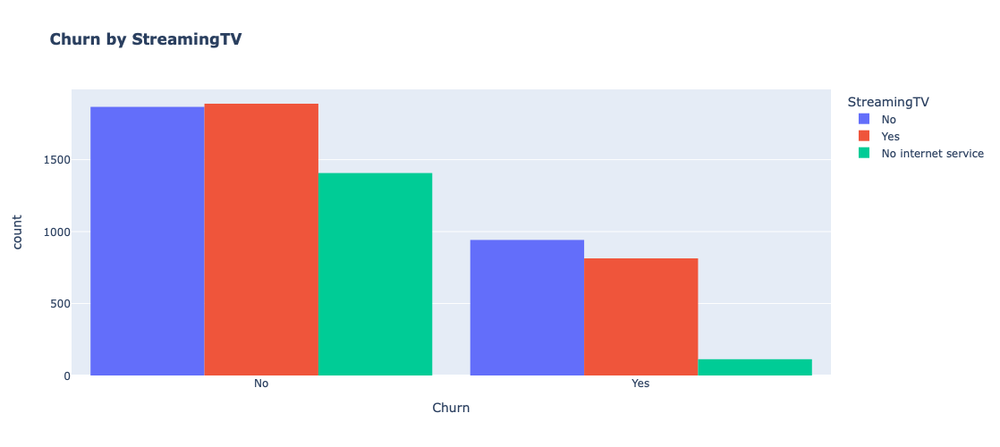

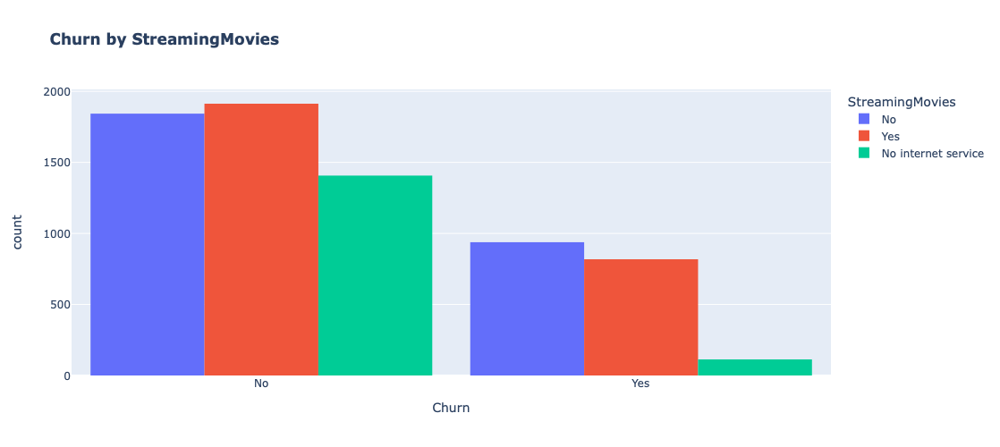

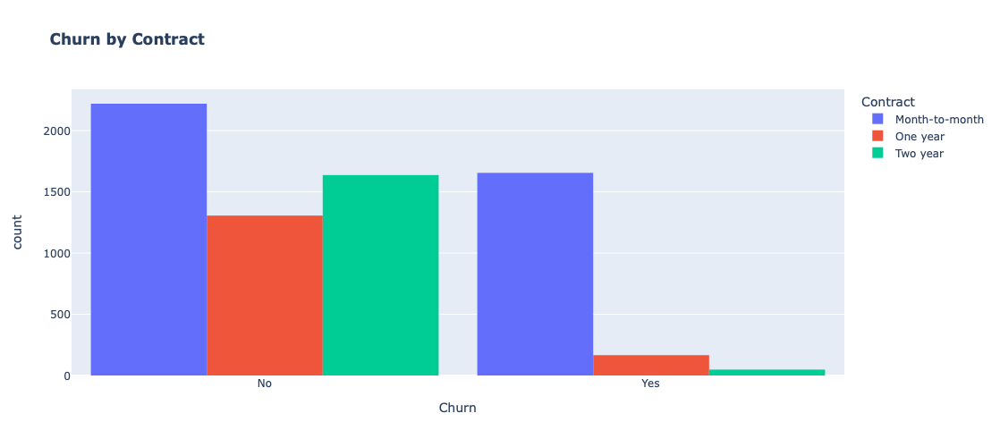

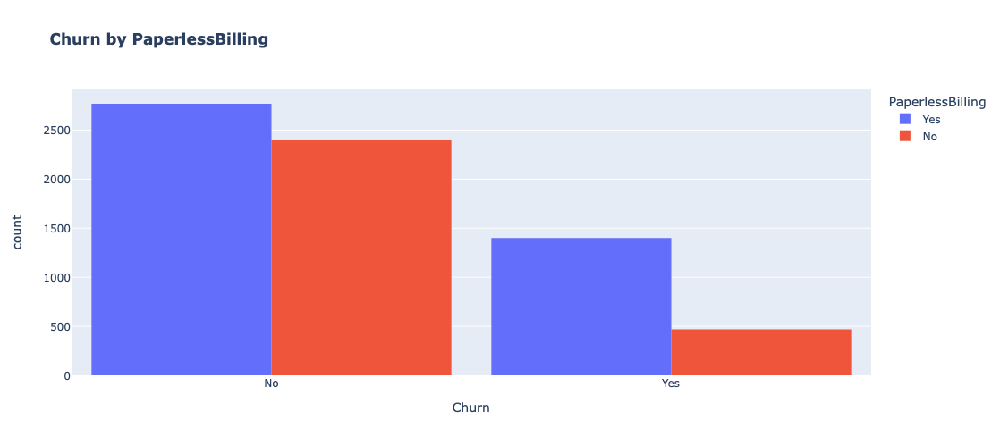

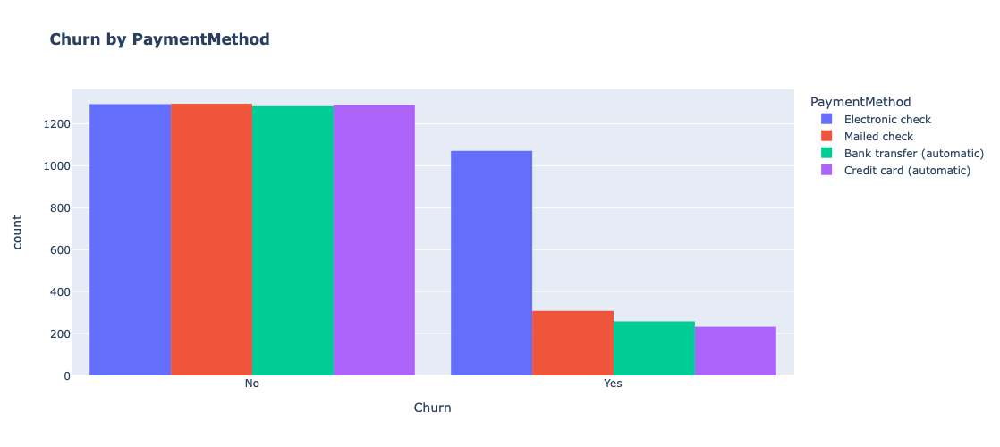

In [23]:
plot_churn_by_categorical_features(df, target_col='Churn')

### Check Distribution of Features

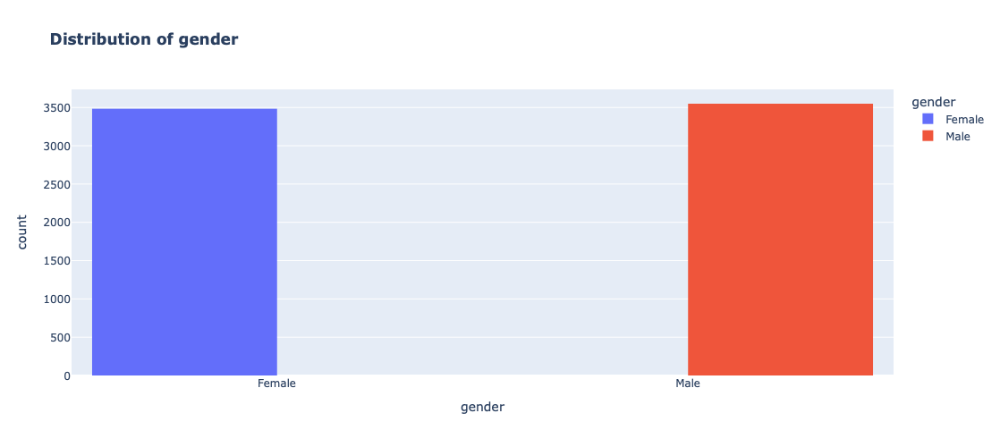

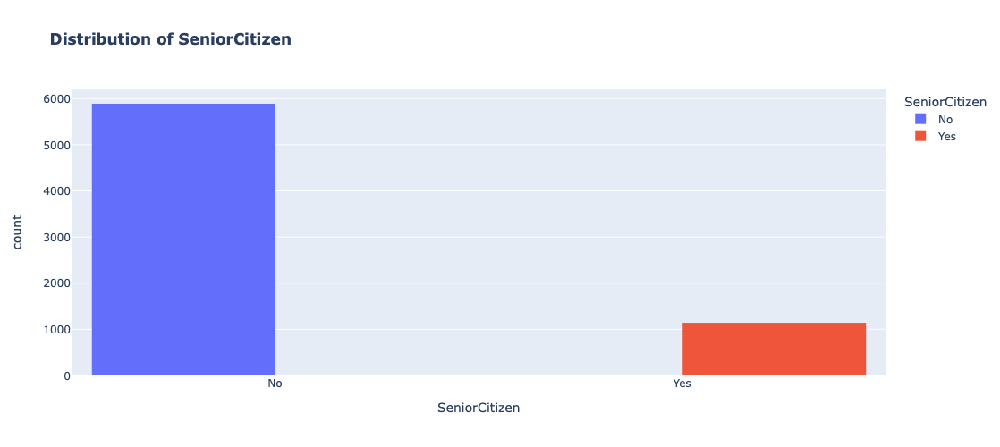

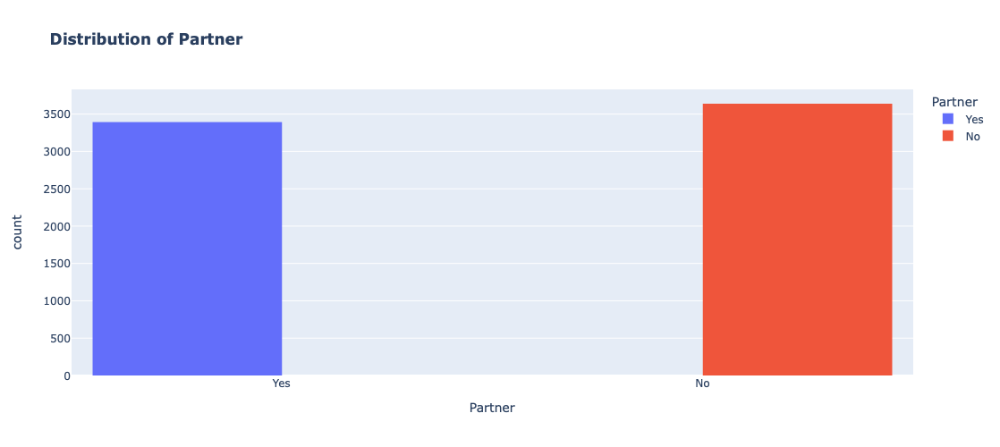

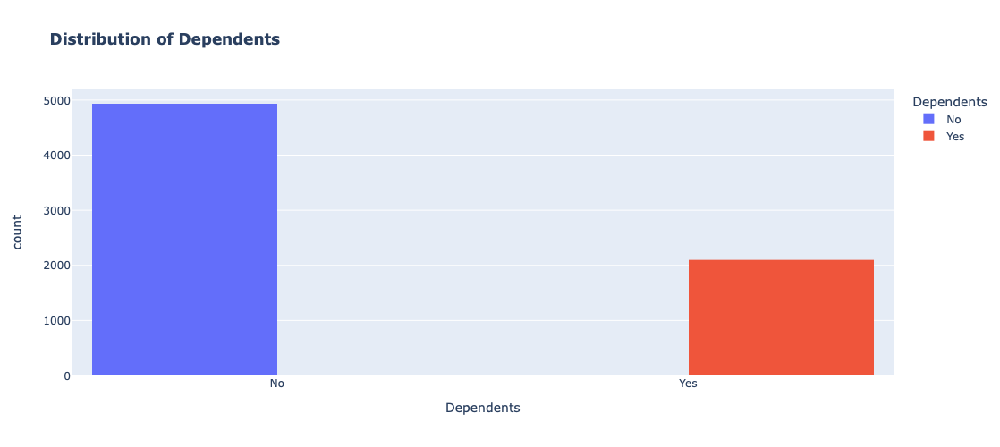

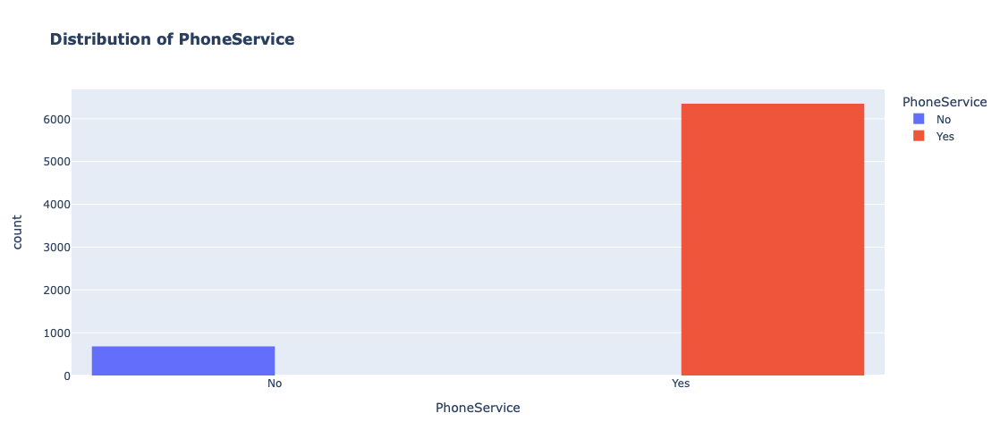

...

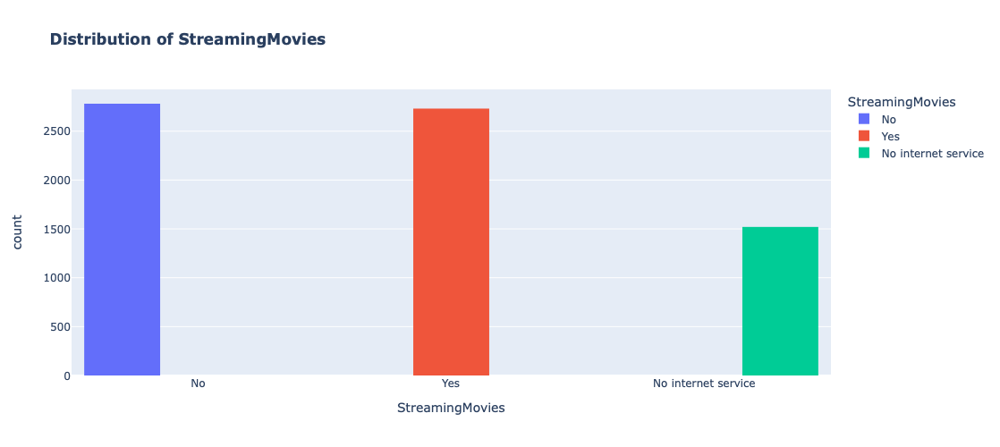

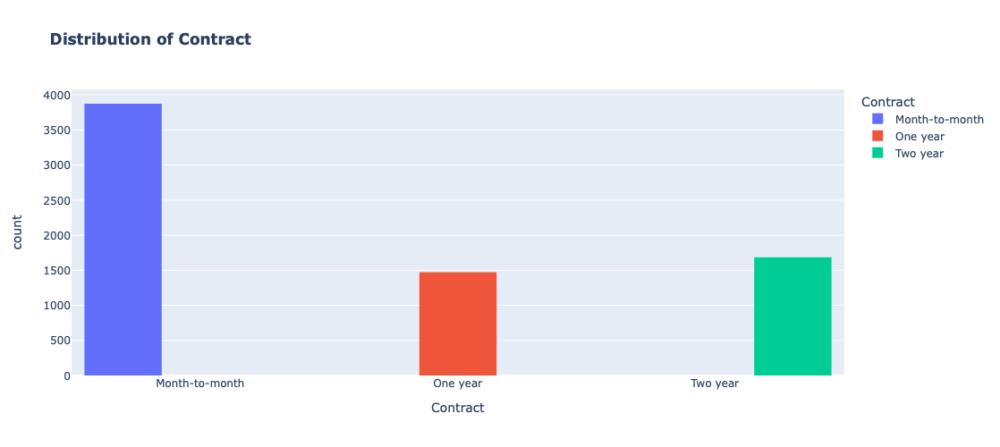

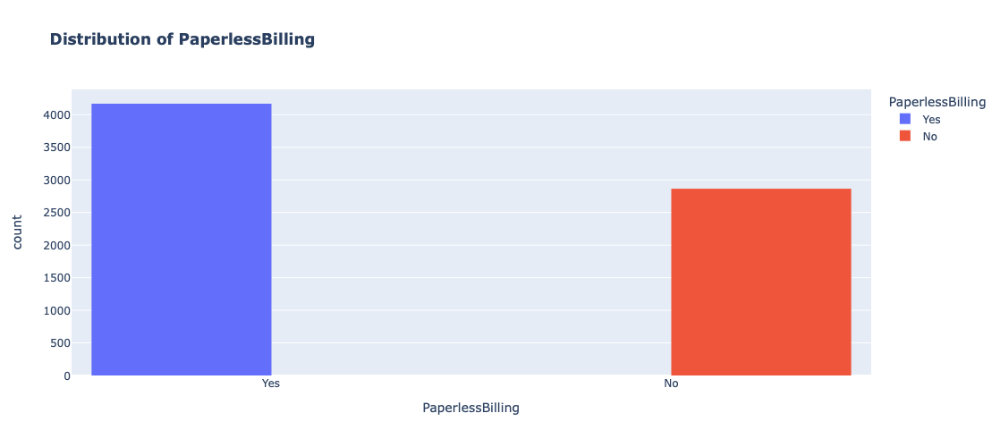

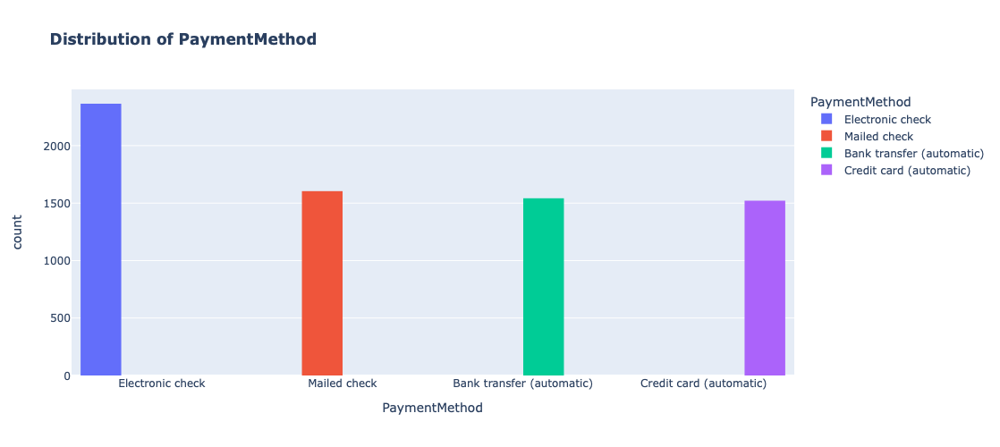

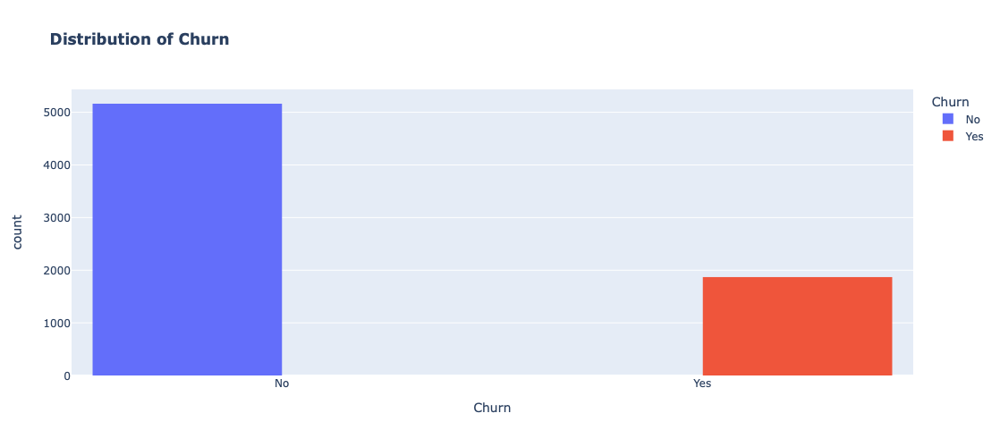

In [25]:
plot_categorical_distributions(df)

### Prepare Data For Model (One-Hot Encoding)

### Dummies

In [49]:
### Turn Categorical Values to Dummies

# Step 1: Separate categorical and numerical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
numerical_df = df.select_dtypes(include=['number'])
categorical_cols = categorical_cols.drop(['Churn'])

# Step 2: One-hot encode categorical columns
categorical_encoded = pd.get_dummies(df[categorical_cols], drop_first=True)

# Step 3: Combine them back
df_encoded = pd.concat([numerical_df, categorical_encoded], axis=1)

df_encoded.head()

,tenure,MonthlyCharges,TotalCharges,gender_Male,SeniorCitizen_Yes,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No internet service,OnlineSecurity_Yes,OnlineBackup_No internet service,OnlineBackup_Yes,DeviceProtection_No internet service,DeviceProtection_Yes,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,1,29.85,29.85,False,False,True,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,True,False
1,34,56.95,1889.50,True,False,False,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,True
2,2,53.85,108.15,True,False,False,False,True,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True
3,45,42.30,1840.75,True,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,True,False,False,False,False,True,False,False,False,False,False
4,2,70.70,151.65,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False


### Label Encode

In [29]:
from sklearn.preprocessing import LabelEncoder

def object_to_int(dataframe_series):
    if dataframe_series.dtype=='object':
        dataframe_series = LabelEncoder().fit_transform(dataframe_series)
    return dataframe_series
    
df_encoded = df.apply(lambda x: object_to_int(x))
df_encoded.head()



,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,1,0,0,2,0,0,0,0,0,1,2,29.85,29.85,0
1,1,0,0,0,34,1,0,0,2,0,2,0,0,0,1,0,3,56.95,1889.50,0
2,1,0,0,0,2,1,0,0,2,2,0,0,0,0,0,1,3,53.85,108.15,1
3,1,0,0,0,45,0,1,0,2,0,2,2,0,0,1,0,0,42.30,1840.75,0
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,151.65,1


In [51]:
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Model Creation and Evaluation

In [53]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, f1_score, recall_score, precision_score,
    roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve
)
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
import warnings
warnings.filterwarnings("ignore")

#### Split & Transform Data

In [56]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Define X and y
X = df_encoded
y = df['Churn'].map({'No': 0, 'Yes': 1})

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Identify numeric columns
numeric_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Set up column transformer to scale only numeric columns
column_transformer = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols)
    ],
    remainder='passthrough'  # keep other (non-numeric) columns as-is
)

# Fit and transform
X_train_scaled = column_transformer.fit_transform(X_train)
X_test_scaled = column_transformer.transform(X_test)

# Optional: Convert back to DataFrame if needed
X_train_scaled = pd.DataFrame(X_train_scaled, columns=column_transformer.get_feature_names_out())
X_test_scaled = pd.DataFrame(X_test_scaled, columns=column_transformer.get_feature_names_out())


### Define Models and Parameter Grids

In [58]:
models = {
    "Logistic Regression": LogisticRegression(),
    "KNN": KNeighborsClassifier(),
    "SVC": SVC(probability=True),
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Gradient Boost": GradientBoostingClassifier()
}

param_grids = {
    "Logistic Regression": {"C": [0.01, 0.1, 1, 10]},
    "KNN": {"n_neighbors": [3, 5, 7]},
    "SVC": {"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]},
    "Random Forest": {"n_estimators": [100, 200], "max_depth": [None, 10]},
    "Decision Tree": {"max_depth": [None, 5, 10]},
    "AdaBoost": {"n_estimators": [50, 100]},
    "Gradient Boost": {"n_estimators": [100, 150], "learning_rate": [0.05, 0.1]}
}

### Train Models & Evaluate

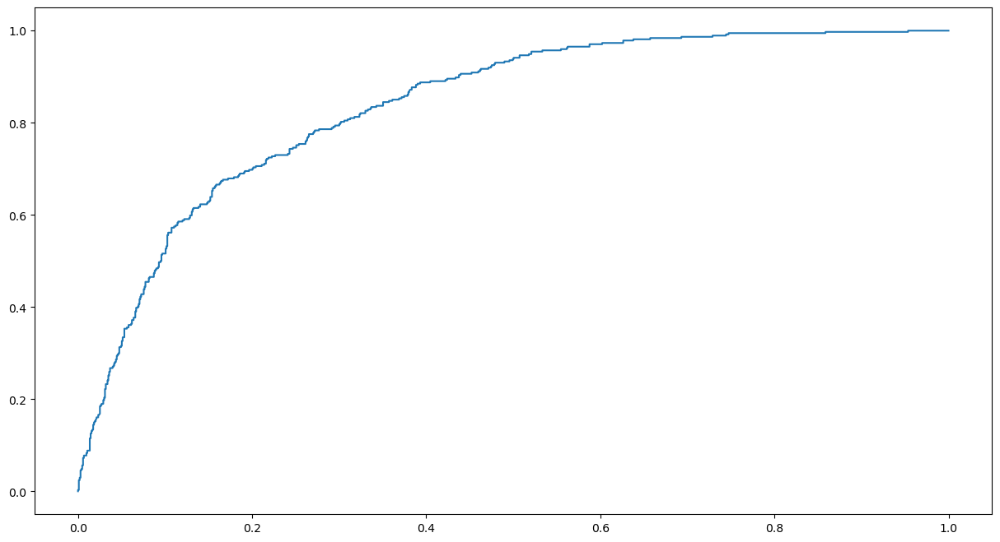

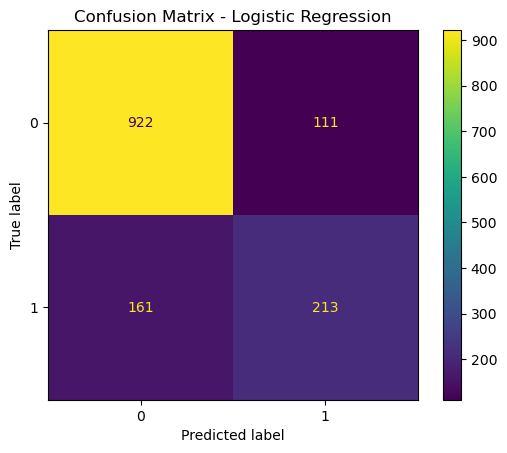

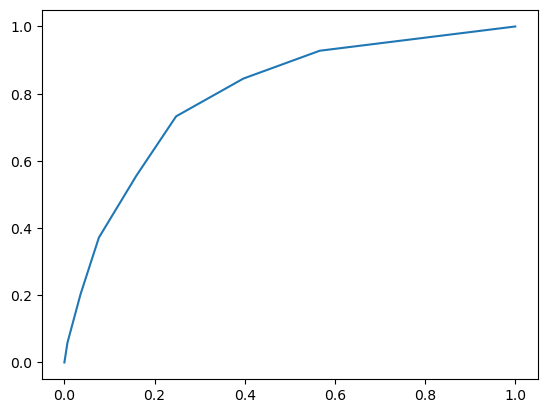

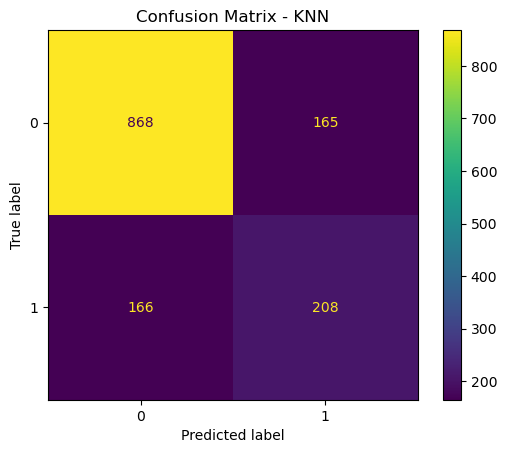

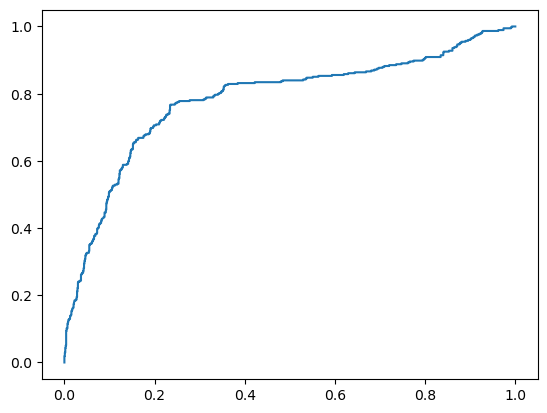

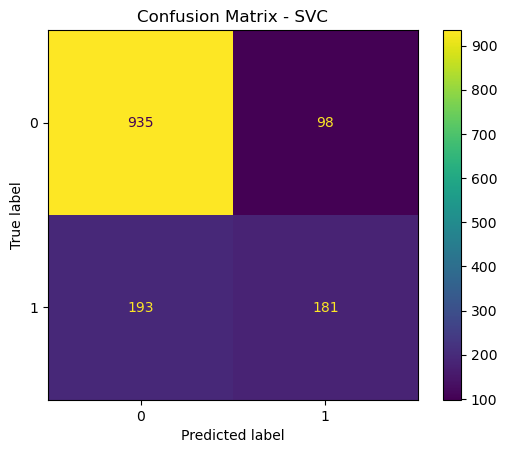

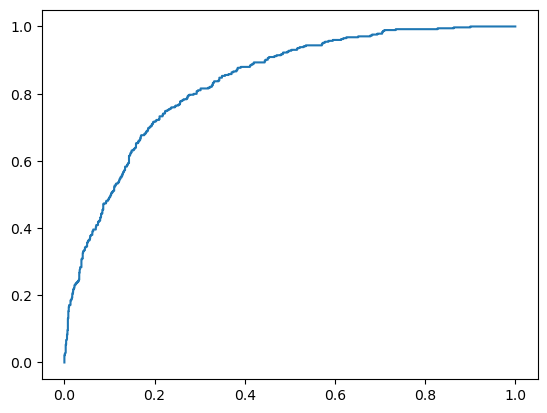

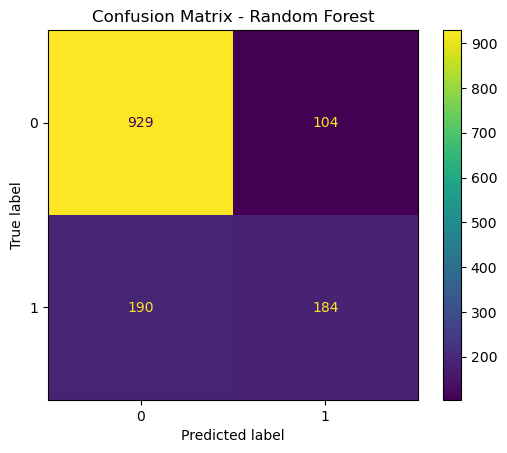

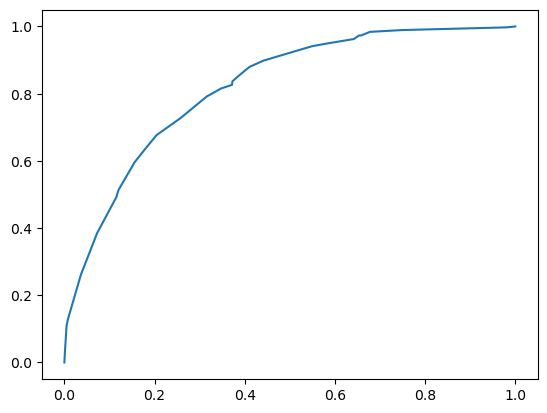

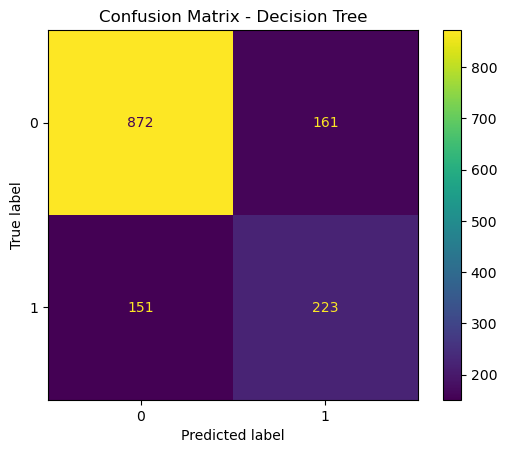

/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/opt/ana

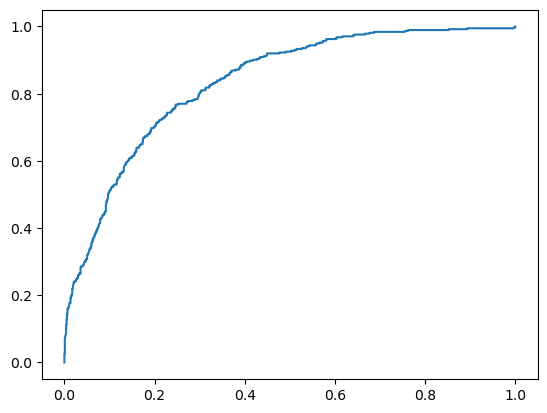

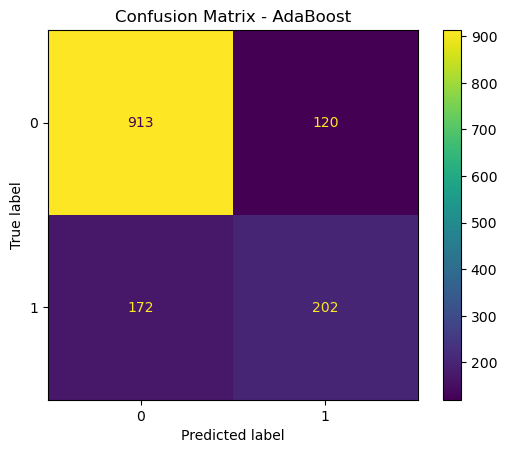

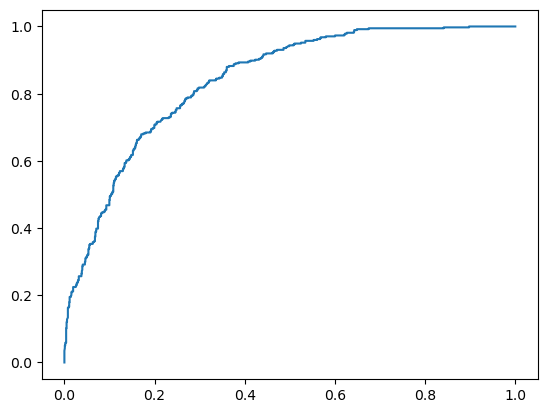

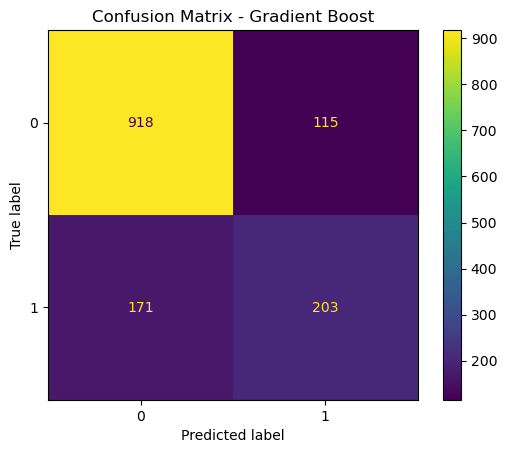

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


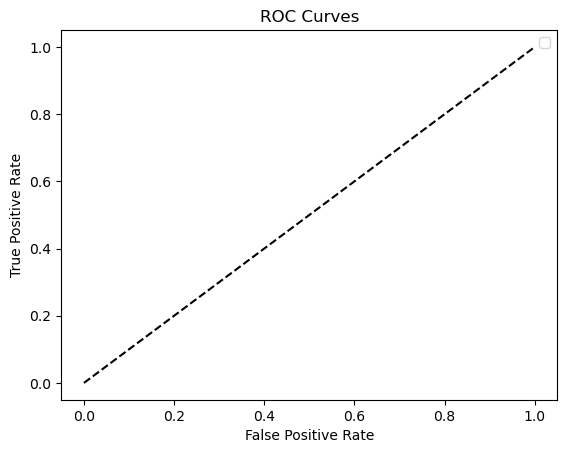

In [60]:
results = []
feature_importance_dict = {}  # NEW: To store features + importance for each model

plt.figure(figsize=(15, 8))

for name, model in models.items():
    grid = GridSearchCV(model, param_grids[name], cv=5, scoring='accuracy', n_jobs=-1)
    grid.fit(X_train_scaled, y_train)
    best_model = grid.best_estimator_

    y_pred = best_model.predict(X_test_scaled)
    y_prob = best_model.predict_proba(X_test_scaled)[:, 1]

    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    from sklearn.metrics import log_loss
    logloss = log_loss(y_test, y_prob)
    k = len(best_model.get_params())
    aic = 2 * k + 2 * logloss * len(y_test)

    results.append({
        "Model": name,
        "Accuracy": accuracy,
        "F1 Score": f1,
        "Recall": recall,
        "Precision": precision,
        "AIC": aic,
        "ROC AUC": roc_auc
    })

    # 💡 Capture feature importance or coefficients
    try:
        if hasattr(best_model, 'coef_'):
            importances = best_model.coef_[0]
        elif hasattr(best_model, 'feature_importances_'):
            importances = best_model.feature_importances_
        else:
            importances = None

        if importances is not None:
            feature_importance_dict[name] = pd.DataFrame({
                'Feature': column_transformer.get_feature_names_out(),
                # 'Feature': X.columns,
                'Importance': importances
            }).sort_values(by='Importance', ascending=False)
    except Exception as e:
        print(f"Could not extract feature importance for {name}: {e}")

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.2f})")

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.title(f'Confusion Matrix - {name}')
    plt.show()

# Final ROC Curve Summary
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves")
plt.legend()
plt.show()

In [62]:
results_df = pd.DataFrame(results).sort_values(by='F1 Score', ascending=False)
results_df

,Model,Accuracy,F1 Score,Recall,Precision,AIC,ROC AUC
0,Logistic Regression,0.806681,0.610315,0.569519,0.657407,1230.736763,0.836043
4,Decision Tree,0.778252,0.588391,0.596257,0.580729,1403.661980,0.819510
6,Gradient Boost,0.796731,0.586705,0.542781,0.638365,1228.486599,0.839744
5,AdaBoost,0.792466,0.580460,0.540107,0.627329,1936.054071,0.833117
1,KNN,0.764748,0.556894,0.556150,0.557641,3568.119211,0.796860
3,Random Forest,0.791045,0.555891,0.491979,0.638889,1240.738576,0.834913
2,SVC,0.793177,0.554364,0.483957,0.648746,1347.776414,0.783306


In [66]:
### View Logistic Regression top features

# feature_importance_dict['Random Forest'].plot.bar(x='Feature', y='Importance')
# feature_importance_dict['Gradient Boost'].plot.bar(x='Feature', y='Importance')


# Top Logistic Regression features
# logreg_features = feature_importance_dict.get("Logistic Regression")
# if logreg_features is not None:
#     print("\nTop features from Logistic Regression:")
#     print(logreg_features.head(10))

# feature_list = logreg_features['Feature'].tolist()
# formatted_string = ",".join(f"'{feature}'" for feature in feature_list)
# formatted_string

### Feature Selection with Logistic Regression - Now that we have identified top features

                                     Model  Accuracy  F1 Score    Recall  \
0  Logistic Regression (Selected Features)  0.800284  0.577444  0.513369   

   Precision          AIC   ROC AUC  
0   0.659794  1291.482731  0.814864  


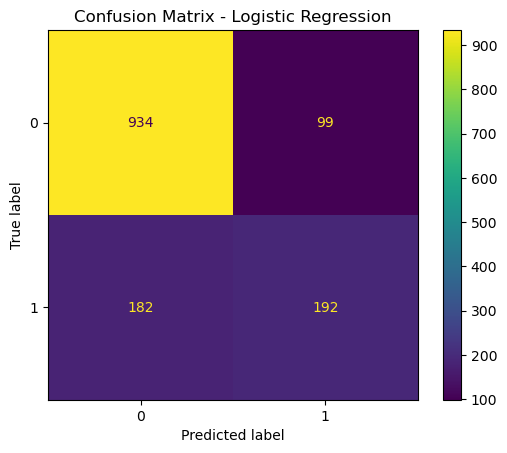

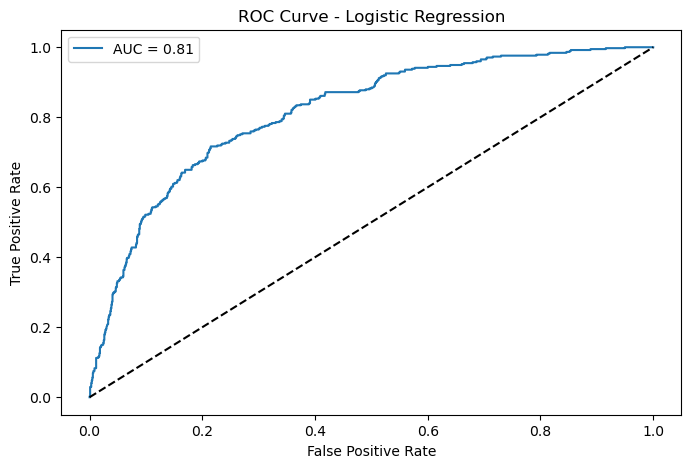

In [68]:
# Replace with your top features
selected_features = ['remainder__InternetService_Fiber optic'
                     ,'remainder__PaymentMethod_Electronic check'
                     ,'num__TotalCharges','remainder__PaperlessBilling_Yes'
                     ,'remainder__MultipleLines_No phone service'
                     ,'remainder__MultipleLines_Yes'
                     ,'remainder__SeniorCitizen_Yes'
                     ,'remainder__StreamingTV_Yes'
                     ,'remainder__StreamingMovies_Yes']
                     # ,'num__MonthlyCharges']
                     # ,'remainder__PaymentMethod_Mailed check']
                     # ,'remainder__PaymentMethod_Credit card (automatic)'
                     # ,'remainder__DeviceProtection_Yes'
                     # ,'remainder__gender_Male'
                     # ,'remainder__Partner_Yes'
                     # ,'remainder__StreamingMovies_No internet service'
                     # ,'remainder__OnlineSecurity_No internet service'
                     # ,'remainder__OnlineBackup_No internet service'
                     # ,'remainder__DeviceProtection_No internet service'
                     # ,'remainder__TechSupport_No internet service'
                     # ,'remainder__StreamingTV_No internet service'
                     # ,'remainder__InternetService_No'
                     # ,'remainder__OnlineBackup_Yes'
                     # ,'remainder__Dependents_Yes'
                     # ,'remainder__PhoneService_Yes'
                     # ,'remainder__TechSupport_Yes'
                     # ,'remainder__OnlineSecurity_Yes'
                     # ,'remainder__Contract_One year'
                     # ,'remainder__Contract_Two year',
                     # 'num__tenure']


# --- Step 1: Filter your features
X_train_selected = X_train_scaled[selected_features]
X_test_selected = X_test_scaled[selected_features]

# --- Step 2: Train final model
final_model = LogisticRegression(max_iter=1000)
final_model.fit(X_train_selected, y_train)

# --- Step 3: Predict
y_pred = final_model.predict(X_test_selected)
y_prob = final_model.predict_proba(X_test_selected)[:, 1]

# --- Step 4: Evaluate
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)
logloss = log_loss(y_test, y_prob)
k = len(final_model.get_params())
aic = 2 * k + 2 * logloss * len(y_test)

# --- Step 5: Print Metrics as DataFrame
results_df = pd.DataFrame([{
    "Model": "Logistic Regression (Selected Features)",
    "Accuracy": accuracy,
    "F1 Score": f1,
    "Recall": recall,
    "Precision": precision,
    "AIC": aic,
    "ROC AUC": roc_auc
}])

print(results_df)

# --- Step 6: Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# --- Step 7: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize=(8, 5))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Logistic Regression")
plt.legend()
plt.show()


In [70]:
X_train_scaled.head()

,num__tenure,num__MonthlyCharges,num__TotalCharges,remainder__gender_Male,remainder__SeniorCitizen_Yes,remainder__Partner_Yes,remainder__Dependents_Yes,remainder__PhoneService_Yes,remainder__MultipleLines_No phone service,remainder__MultipleLines_Yes,remainder__InternetService_Fiber optic,remainder__InternetService_No,remainder__OnlineSecurity_No internet service,remainder__OnlineSecurity_Yes,remainder__OnlineBackup_No internet service,remainder__OnlineBackup_Yes,remainder__DeviceProtection_No internet service,remainder__DeviceProtection_Yes,remainder__TechSupport_No internet service,remainder__TechSupport_Yes,remainder__StreamingTV_No internet service,remainder__StreamingTV_Yes,remainder__StreamingMovies_No internet service,remainder__StreamingMovies_Yes,remainder__Contract_One year,remainder__Contract_Two year,remainder__PaperlessBilling_Yes,remainder__PaymentMethod_Credit card (automatic),remainder__PaymentMethod_Electronic check,remainder__PaymentMethod_Mailed check
0,1.321816,0.981556,1.659900,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,-0.267410,-0.971546,-0.562252,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1.444064,0.837066,1.756104,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,-1.204646,0.641092,-0.908326,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.669826,-0.808787,-0.101561,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Metrics:<br>
Accuracy: Overall correctness<br>

F1: Balance between precision & recall<br>

Recall: Did we catch all the churners?<br>

Precision: How many of the predicted churners were correct?<br>

ROC AUC: AUC of the ROC curve (how well the model separates churners vs. non-churners)<br>

log_loss: Measures how "wrong" the predicted probabilities are.<br>

k: Number of parameters (to penalize complex models).<br>

aic: Approximated version of AIC → reward good fit, penalize complexity (used in model comparison).